In [1]:
%matplotlib inline

In [2]:
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV, learning_curve, validation_curve

In [3]:
df = pd.read_csv("~/projects/us-education-datasets-unification-project/data/us-education-datasets-unification-project/states_all.csv")

In [4]:
df.shape

(1492, 25)

In [5]:
np.sqrt(df.shape[0])
df.shape[0]/50
print('Years/state', len(df)/50)
print('YEARs', df['YEAR'].min(), '--' , df['YEAR'].max())
print('\nSTATEs\n', df['STATE'].unique(), '\n')
print('Features:\n', df.columns.tolist(), '\n')

Years/state 29.84
YEARs 1992 -- 2017

STATEs
 ['ALABAMA' 'ALASKA' 'ARIZONA' 'ARKANSAS' 'CALIFORNIA' 'COLORADO'
 'CONNECTICUT' 'DELAWARE' 'DISTRICT_OF_COLUMBIA' 'FLORIDA' 'GEORGIA'
 'HAWAII' 'IDAHO' 'ILLINOIS' 'INDIANA' 'IOWA' 'KANSAS' 'KENTUCKY'
 'LOUISIANA' 'MAINE' 'MARYLAND' 'MASSACHUSETTS' 'MICHIGAN' 'MINNESOTA'
 'MISSISSIPPI' 'MISSOURI' 'MONTANA' 'NEBRASKA' 'NEVADA' 'NEW_HAMPSHIRE'
 'NEW_JERSEY' 'NEW_MEXICO' 'NEW_YORK' 'NORTH_CAROLINA' 'NORTH_DAKOTA'
 'OHIO' 'OKLAHOMA' 'OREGON' 'PENNSYLVANIA' 'RHODE_ISLAND' 'SOUTH_CAROLINA'
 'SOUTH_DAKOTA' 'TENNESSEE' 'TEXAS' 'UTAH' 'VERMONT' 'VIRGINIA'
 'WASHINGTON' 'WEST_VIRGINIA' 'WISCONSIN' 'WYOMING' 'AMERICAN_SAMOA'
 'BUREAU_OF_INDIAN_AFFAIRS' 'DOD_DOMESTIC' 'DOD_OVERSEAS' 'GUAM'
 'NORTHERN_MARIANAS' 'PUERTO_RICO' 'VIRGIN_ISLANDS' 'BI' 'DD'
 'NORTHERN_MARIANA_ISLANDS' 'DEPARTMENT_OF_DEFENSE'
 'BUREAU_OF_INDIAN_EDUCATION' 'DEPARTMENT_OF_DEFENSE_EDUCATION_ACTIVITY'
 'U.S._VIRGIN_ISLANDS' 'DOD_(OVERSEAS_AND_DOMESTIC_COMBINED)' 'BIE'
 'COMMONWEALT

In [6]:
df.head(5)

,PRIMARY_KEY,STATE,YEAR,ENROLL,TOTAL_REVENUE,FEDERAL_REVENUE,STATE_REVENUE,LOCAL_REVENUE,TOTAL_EXPENDITURE,INSTRUCTION_EXPENDITURE,...,GRADES_4_G,GRADES_8_G,GRADES_12_G,GRADES_1_8_G,GRADES_9_12_G,GRADES_ALL_G,AVG_MATH_4_SCORE,AVG_MATH_8_SCORE,AVG_READING_4_SCORE,AVG_READING_8_SCORE
0,1992_ALABAMA,ALABAMA,1992,NaN,2678885.0,304177.0,1659028.0,715680.0,2653798.0,1481703.0,...,57948.0,58025.0,41167.0,471564.0,196386.0,676174.0,208.327876,252.187522,207.963517,NaN
1,1992_ALASKA,ALASKA,1992,NaN,1049591.0,106780.0,720711.0,222100.0,972488.0,498362.0,...,9748.0,8789.0,6714.0,79117.0,30847.0,112335.0,NaN,NaN,NaN,258.859712
2,1992_ARIZONA,ARIZONA,1992,NaN,3258079.0,297888.0,1369815.0,1590376.0,3401580.0,1435908.0,...,55433.0,49081.0,37410.0,437127.0,175210.0,614881.0,215.253932,265.366278,206.212716,262.169895
3,1992_ARKANSAS,ARKANSAS,1992,NaN,1711959.0,178571.0,958785.0,574603.0,1743022.0,964323.0,...,34632.0,36011.0,27651.0,281338.0,123113.0,405259.0,210.206028,256.312090,208.634458,264.619665
4,1992_CALIFORNIA,CALIFORNIA,1992,NaN,26260025.0,2072470.0,16546514.0,7641041.0,27138832.0,14358922.0,...,418418.0,363296.0,270675.0,3286034.0,1372011.0,4717112.0,208.398961,260.892247,196.764414,NaN


In [7]:
df.describe()

,YEAR,ENROLL,TOTAL_REVENUE,FEDERAL_REVENUE,STATE_REVENUE,LOCAL_REVENUE,TOTAL_EXPENDITURE,INSTRUCTION_EXPENDITURE,SUPPORT_SERVICES_EXPENDITURE,OTHER_EXPENDITURE,...,GRADES_4_G,GRADES_8_G,GRADES_12_G,GRADES_1_8_G,GRADES_9_12_G,GRADES_ALL_G,AVG_MATH_4_SCORE,AVG_MATH_8_SCORE,AVG_READING_4_SCORE,AVG_READING_8_SCORE
count,1492.000000,1.229000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.229000e+03,...,1361.000000,1361.000000,1361.00000,1.361000e+03,1.361000e+03,1.319000e+03,536.000000,532.000000,533.000000,498.000000
mean,2004.433646,9.159308e+05,9.092082e+06,7.663723e+05,4.216553e+06,4.109157e+06,9.196681e+06,4.762966e+06,2.680331e+06,4.292046e+05,...,64538.927259,64271.057311,54268.92432,5.192140e+05,2.470714e+05,8.024415e+05,234.768293,278.414711,218.866154,263.661132
std,7.393983,1.065280e+06,1.174519e+07,1.145242e+06,5.543072e+06,5.482971e+06,1.197813e+07,6.293004e+06,3.353349e+06,5.340693e+05,...,80293.387625,78910.545776,67889.27623,6.436384e+05,3.077056e+05,9.707031e+05,10.221511,10.159722,7.769616,6.803725
min,1992.000000,4.386600e+04,4.656500e+05,3.102000e+04,0.000000e+00,2.209300e+04,4.816650e+05,2.655490e+05,1.399630e+05,1.154100e+04,...,633.000000,437.000000,311.00000,4.878000e+03,1.808000e+03,7.254000e+03,187.134670,232.831510,178.557612,236.379102
25%,1998.000000,2.583140e+05,2.186305e+06,1.893540e+05,1.153097e+06,7.158345e+05,2.165404e+06,1.168032e+06,6.357900e+05,1.028310e+05,...,13739.000000,13342.000000,10919.00000,1.106260e+05,5.147100e+04,1.810650e+05,229.694352,272.761598,214.663401,259.533171
50%,2004.000000,6.483130e+05,5.079546e+06,4.033765e+05,2.537074e+06,2.055780e+06,5.234506e+06,2.657452e+06,1.525406e+06,2.715960e+05,...,43272.000000,43339.000000,36735.00000,3.457750e+05,1.642600e+05,5.503420e+05,237.238552,280.618803,220.416034,265.010912
75%,2011.000000,1.014528e+06,1.085985e+07,8.289660e+05,5.080939e+06,4.768680e+06,1.074519e+07,5.568028e+06,3.229651e+06,5.186000e+05,...,75481.000000,76566.000000,67460.00000,6.119050e+05,2.905020e+05,9.282755e+05,241.995486,285.347428,223.999337,268.190121
max,2017.000000,6.307022e+06,8.921726e+07,9.990221e+06,5.090457e+07,3.610526e+07,8.532013e+07,4.396452e+07,2.605802e+07,3.995951e+06,...,493415.000000,500143.000000,498403.00000,3.929869e+06,2.013687e+06,5.944746e+06,253.420961,300.568235,236.773867,280.499130


In [8]:
set(df[df['AVG_MATH_4_SCORE']>0]['YEAR'].subtract(1).tolist())

{1991, 1995, 1999, 2002, 2004, 2006, 2008, 2010, 2012, 2014, 2016}

(23, 23)


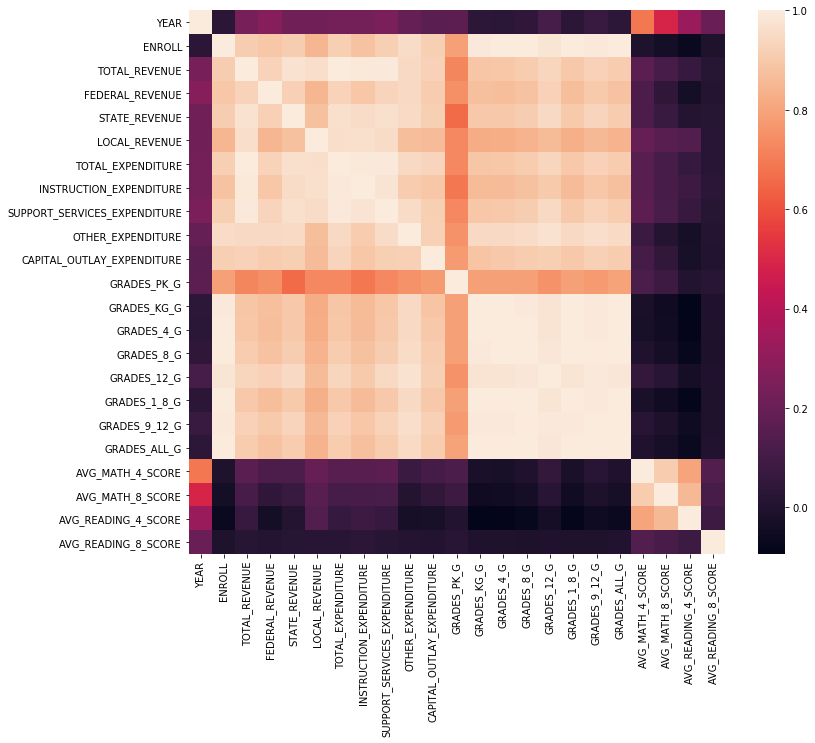

In [9]:
#plt.figure(figsize=(15,15))
corr = df.corr()
print(corr.shape)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr)

/Users/daviderickson/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/daviderickson/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


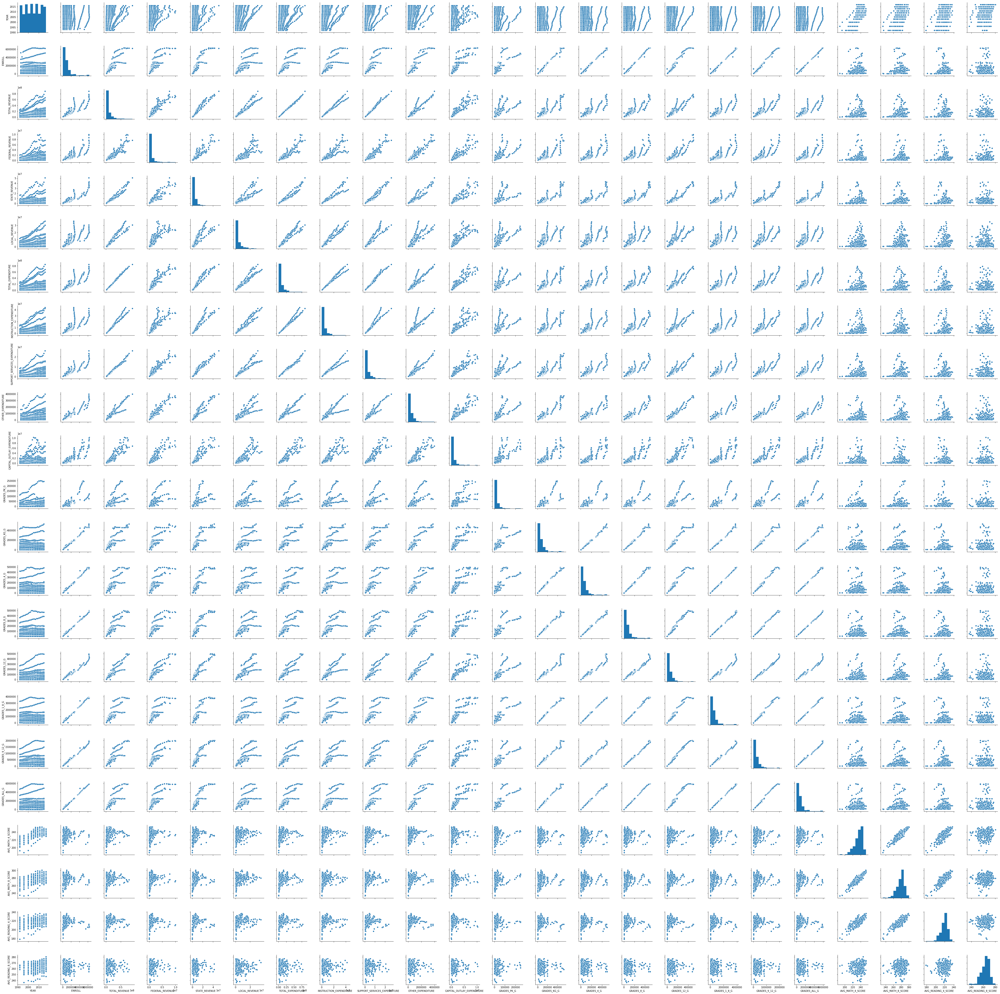

In [10]:
sns.pairplot(df)

(413, 54)
Index(['AVG_MATH_8_SCORE', 'AVG_READING_4_SCORE', 'AVG_READING_8_SCORE',
       'STATE_ALABAMA', 'STATE_ALASKA', 'STATE_ARIZONA', 'STATE_ARKANSAS',
       'STATE_CALIFORNIA', 'STATE_COLORADO', 'STATE_CONNECTICUT',
       'STATE_DELAWARE', 'STATE_DISTRICT_OF_COLUMBIA', 'STATE_FLORIDA',
       'STATE_GEORGIA', 'STATE_HAWAII', 'STATE_IDAHO', 'STATE_ILLINOIS',
       'STATE_INDIANA', 'STATE_IOWA', 'STATE_KANSAS', 'STATE_KENTUCKY',
       'STATE_LOUISIANA', 'STATE_MAINE', 'STATE_MARYLAND',
       'STATE_MASSACHUSETTS', 'STATE_MICHIGAN', 'STATE_MINNESOTA',
       'STATE_MISSISSIPPI', 'STATE_MISSOURI', 'STATE_MONTANA',
       'STATE_NEBRASKA', 'STATE_NEVADA', 'STATE_NEW_HAMPSHIRE',
       'STATE_NEW_JERSEY', 'STATE_NEW_MEXICO', 'STATE_NEW_YORK',
       'STATE_NORTH_CAROLINA', 'STATE_NORTH_DAKOTA', 'STATE_OHIO',
       'STATE_OKLAHOMA', 'STATE_OREGON', 'STATE_PENNSYLVANIA',
       'STATE_RHODE_ISLAND', 'STATE_SOUTH_CAROLINA', 'STATE_SOUTH_DAKOTA',
       'STATE_TENNESSEE', 'STATE_TEX

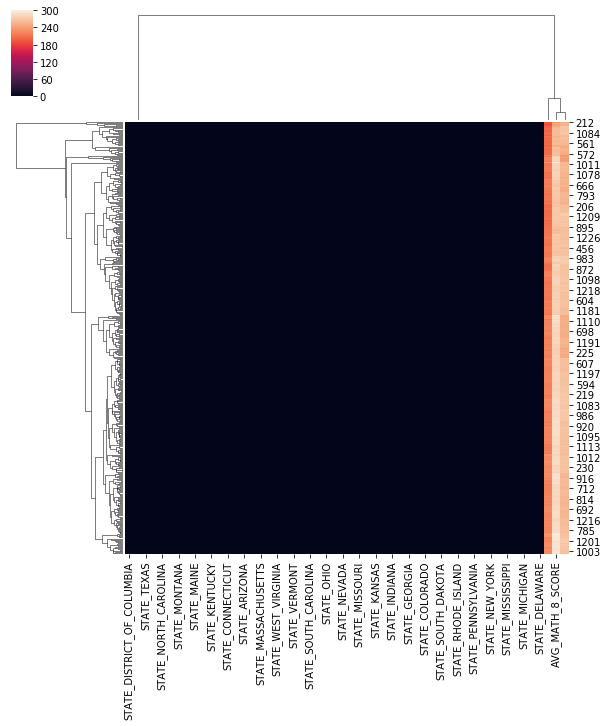

In [11]:
df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)

print(df1.shape)
print(df1.columns)
sns.clustermap(df1)

In [12]:
# Agglomerative Clustering

from sklearn.cluster import AgglomerativeClustering
agg_clus = AgglomerativeClustering()
print(agg_clus)

print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)
clustering = agg_clus.fit(df1)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func='deprecated')
(1492, 25)
(413, 25)


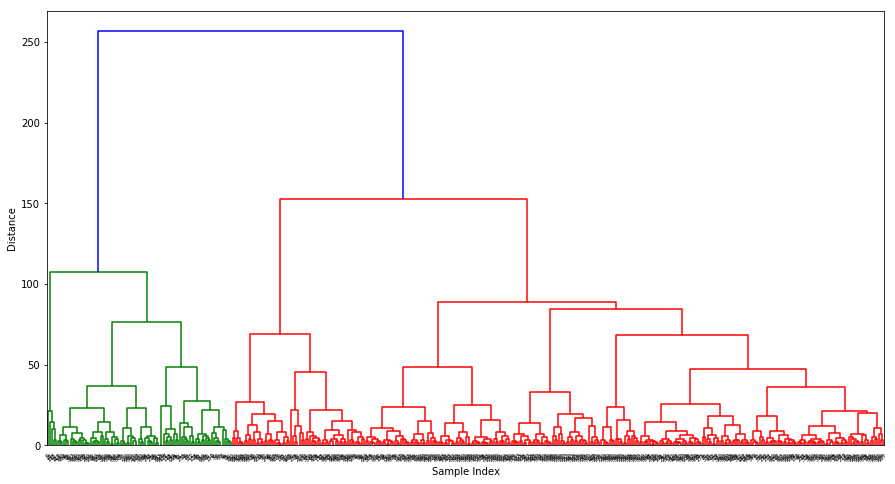

In [13]:
from scipy.cluster.hierarchy import dendrogram, linkage

Z = linkage(df1, 'ward')

plt.figure(figsize=(15,8))
plt.ylabel('Distance')
plt.xlabel('Sample Index')
dendrogram(Z, leaf_rotation=45.)
plt.show()

[[736.         768.          22.25109954  18.        ]
 [769.         782.          23.2696012   31.        ]
 [765.         773.          23.51470828  19.        ]
 [764.         785.          23.76395544  36.        ]
 [771.         788.          23.89484681  19.        ]
 [413.         762.          24.56808114  10.        ]
 [780.         789.          24.97189591  36.        ]
 [783.         792.          25.72342087  55.        ]
 [758.         794.          26.92128905  29.        ]
 [781.         800.          27.34255009  26.        ]
 [779.         793.          33.05770554  44.        ]
 [791.         796.          35.98485961  66.        ]
 [801.         802.          36.92491128  50.        ]
 [798.         799.          45.4699028   37.        ]
 [807.         811.          47.33684934 121.        ]
 [805.         809.          48.49357775  36.        ]
 [803.         806.          48.7493934   72.        ]
 [804.         814.          68.48279513 140.        ]
 [808.    

Text(0, 0.5, 'Distance Merged')

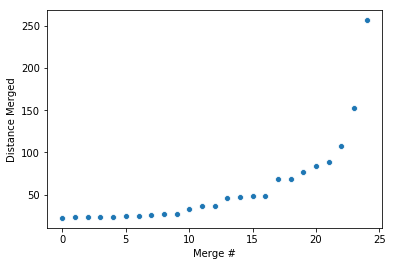

In [14]:
Z_trunc = Z[-25:,:]

print(Z_trunc)
ax=sns.scatterplot(np.arange(len(Z_trunc)), Z_trunc[:,2])
plt.xlabel('Merge #')
plt.ylabel('Distance Merged')

In [15]:
from scipy.cluster.hierarchy import fcluster

max_d = 2
clusters = fcluster(Z, max_d, criterion='maxclust')
clusters
print('Cluster #1:\n', df.dropna()[clusters==1]['STATE'].unique(), '\n')
print('Cluster #2:\n', df.dropna()[clusters==2]['STATE'].unique())

set1 = set(df.dropna()[clusters==1]['STATE'])
set2 = set(df.dropna()[clusters==2]['STATE'])
print('\nCluster1 only: ', set1 - set2)
print('\nCluster2 only: ', set2 - set1)

Cluster #1:
 ['ALABAMA' 'ARIZONA' 'ARKANSAS' 'CALIFORNIA' 'DISTRICT_OF_COLUMBIA'
 'FLORIDA' 'HAWAII' 'LOUISIANA' 'NEW_MEXICO' 'NORTH_CAROLINA' 'TENNESSEE'
 'TEXAS' 'VIRGINIA' 'KENTUCKY' 'NEVADA' 'OKLAHOMA' 'WEST_VIRGINIA'
 'MISSISSIPPI' 'RHODE_ISLAND' 'GEORGIA' 'SOUTH_CAROLINA'] 

Cluster #2:
 ['COLORADO' 'CONNECTICUT' 'IOWA' 'KENTUCKY' 'MAINE' 'MARYLAND'
 'MASSACHUSETTS' 'MONTANA' 'WASHINGTON' 'WISCONSIN' 'GEORGIA' 'IDAHO'
 'INDIANA' 'KANSAS' 'MINNESOTA' 'MISSOURI' 'NEBRASKA' 'NORTH_CAROLINA'
 'NORTH_DAKOTA' 'OHIO' 'OREGON' 'SOUTH_CAROLINA' 'UTAH' 'VERMONT'
 'VIRGINIA' 'ALASKA' 'DELAWARE' 'FLORIDA' 'ILLINOIS' 'MICHIGAN'
 'NEW_HAMPSHIRE' 'NEW_JERSEY' 'NEW_YORK' 'OKLAHOMA' 'PENNSYLVANIA'
 'RHODE_ISLAND' 'SOUTH_DAKOTA' 'TEXAS' 'WEST_VIRGINIA' 'WYOMING'
 'ARKANSAS' 'ARIZONA' 'NEVADA' 'TENNESSEE' 'ALABAMA' 'CALIFORNIA' 'HAWAII']

Cluster1 only:  {'LOUISIANA', 'DISTRICT_OF_COLUMBIA', 'NEW_MEXICO', 'MISSISSIPPI'}

Cluster2 only:  {'PENNSYLVANIA', 'UTAH', 'VERMONT', 'SOUTH_DAKOTA', 'KANSAS', 

In [16]:
# PCA

from sklearn.decomposition import PCA
pca = PCA()
print(pca)

print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)
pca.fit(df1)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
(1492, 25)
(413, 25)


PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

Text(0, 0.5, 'Explained Variance')

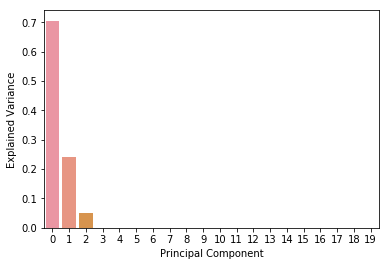

In [17]:
ax = sns.barplot(x=np.arange(20), y=pca.explained_variance_[0:20]/sum(pca.explained_variance_[0:20]))
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')

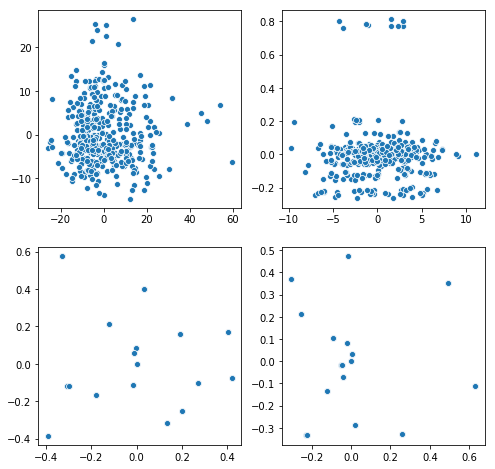

In [18]:
X_pca = pca.fit(df1).transform(df1)
plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
sns.scatterplot(X_pca[:,0], X_pca[:,1])
plt.subplot(2,2,2)
sns.scatterplot(X_pca[:,2], X_pca[:,3])
plt.subplot(2,2,3)
sns.scatterplot(X_pca[:,4], X_pca[:,5])
plt.subplot(2,2,4)
sns.scatterplot(X_pca[:,6], X_pca[:,7])

In [20]:
X_pca_df = pd.DataFrame(X_pca)
print(X_pca_df.shape)
print(df.shape)
X_pca_df.head(5)

(413, 54)
(1492, 25)


,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,53
0,23.571524,1.784596,-7.054729,-0.243378,-1.212814e-01,2.152192e-01,-4.345837e-02,-7.110527e-02,3.366180e-02,1.048736e-01,...,2.971782e-16,-9.736713e-16,-1.155702e-14,-8.437576e-16,5.757654e-15,-1.064386e-15,-0.029130,0.000845,-0.026965,-1.092591e-16
1,16.997771,-1.303508,3.099418,-0.123219,-1.590266e-02,-1.142258e-01,3.750142e-03,3.396099e-02,1.684512e-02,1.633815e-01,...,2.434017e-16,-3.665181e-16,1.661489e-14,2.439140e-16,1.381814e-15,7.792960e-17,0.003047,0.160101,-0.033734,1.763242e-18
2,19.852474,-9.767561,-3.024893,-0.146795,-9.121913e-04,8.322984e-02,-2.282784e-02,8.382454e-02,-4.181189e-02,4.780973e-02,...,7.915743e-16,-1.479429e-16,4.913402e-14,1.034948e-15,-3.494404e-16,5.364347e-17,0.020388,0.003369,-0.112199,-2.599233e-17
3,23.343371,-7.784619,3.309397,-0.088741,1.298310e-18,-2.737616e-16,-3.686777e-15,2.660320e-15,-9.921324e-16,-1.472343e-15,...,-7.037573e-16,-5.070307e-16,4.134191e-17,5.995323e-16,-5.090350e-16,-3.107023e-15,0.062406,0.017595,-0.069523,-1.092591e-16
4,1.355439,-4.462846,-4.506652,0.010422,-1.625872e-15,1.257999e-15,5.788283e-15,1.492851e-15,-4.301985e-15,1.417706e-15,...,-3.637515e-16,1.278781e-16,1.956477e-15,2.369751e-16,-5.229128e-16,1.999136e-15,0.066994,0.147651,-0.071759,-9.538127e-17


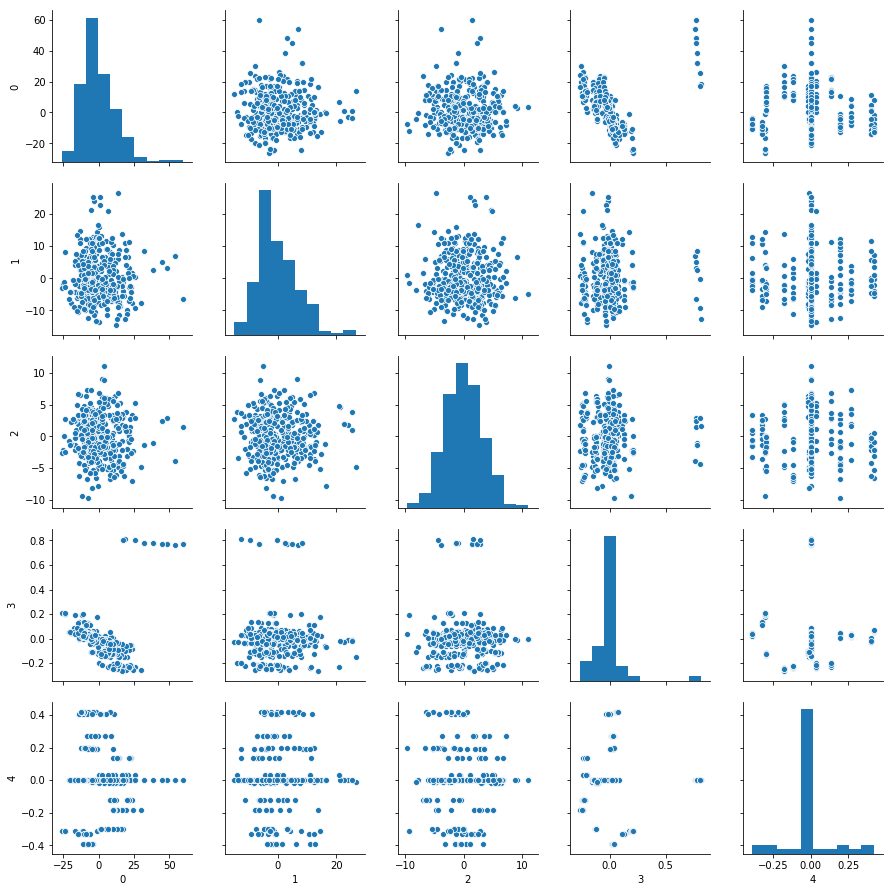

In [21]:
sns.pairplot(X_pca_df.iloc[:,0:5])

In [22]:
# sns.pairplot(X_pca_df)

In [23]:
shift_cols= ['PRIMARY_KEY', 'YEAR', 'STATE', 'AVG_MATH_4_SCORE']


In [24]:
# Function to return most recent test result
def most_recent_test(cur_yr, state, df, new_cols):
    most_recent_value= new_cols
    print(most_recent_value)
    df_scratch= df # .copy()
    df_scratch= df_scratch[df_scratch['STATE']==state]
    df_scratch= df_scratch[df_scratch['YEAR']<cur_yr]
    df_scratch.sort_values(by='YEAR')
    
    for new_col in new_cols:
        df_scratch2= df_scratch[df_scratch[new_col].notna()]
        if df_scratch2.notna().any().any(): 
            most_recent_value[new_col]= df_scratch2[new_col].iloc[-1]
        else:
            most_recent_value[new_col]= np.nan #Should handle these cases better
    return most_recent_test

In [25]:
# Function to return most recent test result
def most_recent_test(cur_yr, state, df):
    df_scratch= df # .copy()
    df_scratch= df_scratch[df_scratch['STATE']==state]
    df_scratch= df_scratch[df_scratch['YEAR']<cur_yr]
    df_scratch.sort_values(by='YEAR')

    df_scratch2= df_scratch[df_scratch['AVG_MATH_4_SCORE'].notna()]
    if df_scratch2.notna().any().any(): 
        most_recent_value= df_scratch2['AVG_MATH_4_SCORE'].iloc[-1]
    else:
        most_recent_value= np.nan #Should handle these cases better
    return most_recent_value

In [26]:
most_recent_test(2009, 'VIRGINIA', df)

243.52112978321603

In [27]:
#most_recent_test(2009, 'VIRGINIA', df, ['AVG_MATH_4_SCORE', 'YEAR'])

In [28]:
df[df['STATE']=='VIRGINIA'][df['YEAR'] <1997][['YEAR', 'AVG_MATH_4_SCORE']]

/Users/daviderickson/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,YEAR,AVG_MATH_4_SCORE
46,1992,220.762964
97,1993,NaN
148,1994,NaN
199,1995,NaN
250,1996,222.643213


In [29]:
# Add recent_AVG_MATH_4_SCORE
df['recent_AVG_MATH_4_SCORE'] = np.zeros(len(df))
#new_cols= ['']
for index, data in df.iterrows(): 
    recent_test= most_recent_test(cur_yr=data['YEAR'], state=data['STATE'], df=df)
    df.loc[index, 'recent_AVG_MATH_4_SCORE']= recent_test



In [30]:
print(np.count_nonzero(~np.isnan(df['recent_AVG_MATH_4_SCORE'])))
print(np.shape(df['recent_AVG_MATH_4_SCORE']))

# print(df['recent_AVG_MATH_4_SCORE'].value_counts())

1229
(1492,)


In [31]:
#Normalize expenditures to fraction of total expenditures
expenditure_cols = ['INSTRUCTION_EXPENDITURE',
 'SUPPORT_SERVICES_EXPENDITURE',
 'OTHER_EXPENDITURE',
 'CAPITAL_OUTLAY_EXPENDITURE']

for col in expenditure_cols:
    df['fracn_exp_{}'.format(col)] = df[col] / df['TOTAL_EXPENDITURE']
    #df=df.drop(col, axis=1)
    print('fracn_exp_{}'.format(col))

fracn_exp_INSTRUCTION_EXPENDITURE
fracn_exp_SUPPORT_SERVICES_EXPENDITURE
fracn_exp_OTHER_EXPENDITURE
fracn_exp_CAPITAL_OUTLAY_EXPENDITURE


In [32]:
#Normalize revenue to fraction of total revenue
revenue_cols = ['FEDERAL_REVENUE',
 'STATE_REVENUE',
 'LOCAL_REVENUE']

for col in revenue_cols:
    df['fracn_rev_{}'.format(col)] = df[col] / df['TOTAL_REVENUE']
    #df=df.drop(col, axis=1)
    print('fracn_rev_{}'.format(col))

fracn_rev_FEDERAL_REVENUE
fracn_rev_STATE_REVENUE
fracn_rev_LOCAL_REVENUE


In [33]:
#Normalize students enrolled to fraction of enrolled population
fracn_enroll_cols = ['GRADES_PK_G', 'GRADES_KG_G',
       'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', 'GRADES_1_8_G',
       'GRADES_9_12_G']

for col in fracn_enroll_cols:
    df['fracn_enroll_{}'.format(col)] = df[col] / df['GRADES_ALL_G']
    print('fracn_enroll_{}'.format(col))
    #df = df.drop(col, axis=1) 

fracn_enroll_GRADES_PK_G
fracn_enroll_GRADES_KG_G
fracn_enroll_GRADES_4_G
fracn_enroll_GRADES_8_G
fracn_enroll_GRADES_12_G
fracn_enroll_GRADES_1_8_G
fracn_enroll_GRADES_9_12_G


In [34]:
df['avg_total_revenue']=df['TOTAL_REVENUE']/df['GRADES_ALL_G']
df['avg_total_expenditure'] = df['TOTAL_EXPENDITURE'] / df['GRADES_ALL_G']

df['fracn_schoolage'] = df['GRADES_ALL_G']/df['ENROLL']
df['rev_per_person'] = df['TOTAL_REVENUE'] / df['ENROLL']
df['exp_per_rev'] = df['TOTAL_EXPENDITURE'] / df['TOTAL_REVENUE']

#Models want to know about drop-out rate
df['fracn_GRADES_12div8_G'] = np.zeros(len(df))
#Subtract take ratio GRADES_12_G(YEAR)/GRADES_8_G(YEAR-4)
for state in set(df['STATE'].tolist()):
    for year in set(df['YEAR'].tolist()):
        key= "{}_{}".format(year, state)
        lag_year = year-4
        lag_key= "{}_{}".format(lag_year, state)
        if np.any(df['PRIMARY_KEY']==lag_key):
            df.loc[df['PRIMARY_KEY']==key, ['fracn_GRADES_12div8_G']]= np.divide( \
                df[df['PRIMARY_KEY']==key]['GRADES_12_G'], np.median(df[df['PRIMARY_KEY']==lag_key]['GRADES_8_G']))

/Users/daviderickson/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:3405: RuntimeWarning: Invalid value encountered in median
  r = func(a, **kwargs)


In [35]:
print(df.shape)
print(np.count_nonzero(df['fracn_GRADES_12div8_G'].notna()))
df['fracn_GRADES_12div8_G'].describe()

(1492, 46)
1371


count    1371.000000
mean        0.708303
std         0.704127
min         0.000000
25%         0.706076
50%         0.844276
75%         0.918057
max        23.031582
Name: fracn_GRADES_12div8_G, dtype: float64

In [36]:
df.describe()

,YEAR,ENROLL,TOTAL_REVENUE,FEDERAL_REVENUE,STATE_REVENUE,LOCAL_REVENUE,TOTAL_EXPENDITURE,INSTRUCTION_EXPENDITURE,SUPPORT_SERVICES_EXPENDITURE,OTHER_EXPENDITURE,...,fracn_enroll_GRADES_8_G,fracn_enroll_GRADES_12_G,fracn_enroll_GRADES_1_8_G,fracn_enroll_GRADES_9_12_G,avg_total_revenue,avg_total_expenditure,fracn_schoolage,rev_per_person,exp_per_rev,fracn_GRADES_12div8_G
count,1492.000000,1.229000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.280000e+03,1.229000e+03,...,1319.000000,1319.000000,1319.000000,1319.000000,1218.000000,1218.000000,1168.000000,1229.000000,1280.000000,1371.000000
mean,2004.433646,9.159308e+05,9.092082e+06,7.663723e+05,4.216553e+06,4.109157e+06,9.196681e+06,4.762966e+06,2.680331e+06,4.292046e+05,...,0.081975,0.068852,0.664569,0.312266,11.114131,11.185505,0.945783,10.219307,1.006872,0.708303
std,7.393983,1.065280e+06,1.174519e+07,1.145242e+06,5.543072e+06,5.482971e+06,1.197813e+07,6.293004e+06,3.353349e+06,5.340693e+05,...,0.004651,0.010823,0.027483,0.029243,19.138258,19.721030,0.085514,4.141731,0.043190,0.704127
min,1992.000000,4.386600e+04,4.656500e+05,3.102000e+04,0.000000e+00,2.209300e+04,4.816650e+05,2.655490e+05,1.399630e+05,1.154100e+04,...,0.054466,0.019712,0.563494,0.110110,2.576621,2.563009,0.019949,3.543637,0.717038,0.000000
25%,1998.000000,2.583140e+05,2.186305e+06,1.893540e+05,1.153097e+06,7.158345e+05,2.165404e+06,1.168032e+06,6.357900e+05,1.028310e+05,...,0.080119,0.062276,0.646530,0.300543,7.380779,7.395321,0.922958,7.218376,0.984550,0.706076
50%,2004.000000,6.483130e+05,5.079546e+06,4.033765e+05,2.537074e+06,2.055780e+06,5.234506e+06,2.657452e+06,1.525406e+06,2.715960e+05,...,0.082237,0.069079,0.662824,0.315040,9.847427,9.900949,0.935351,9.429099,1.006411,0.844276
75%,2011.000000,1.014528e+06,1.085985e+07,8.289660e+05,5.080939e+06,4.768680e+06,1.074519e+07,5.568028e+06,3.229651e+06,5.186000e+05,...,0.084598,0.076759,0.682337,0.329448,12.465513,12.449592,0.950903,12.056643,1.029673,0.918057
max,2017.000000,6.307022e+06,8.921726e+07,9.990221e+06,5.090457e+07,3.610526e+07,8.532013e+07,4.396452e+07,2.605802e+07,3.995951e+06,...,0.094701,0.096302,0.783009,0.372855,601.454753,620.522359,1.782240,29.948695,1.185742,23.031582


In [37]:
#sns.pairplot(df, kind='scatter')

(44, 44)


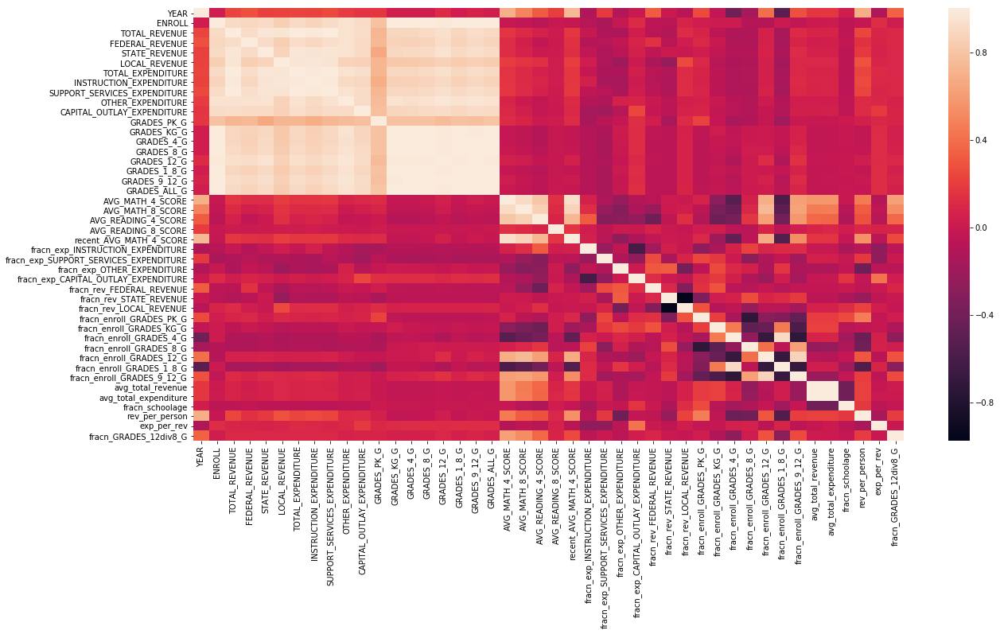

In [38]:
#plt.figure(figsize=(15,15))
corr = df.corr()
print(corr.shape)
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(corr)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func='deprecated')
(1492, 46)
(409, 46)
(409, 24)
Agglomerative Clustering with features:
 Index(['AVG_MATH_8_SCORE', 'AVG_READING_4_SCORE', 'AVG_READING_8_SCORE',
       'recent_AVG_MATH_4_SCORE', 'fracn_exp_INSTRUCTION_EXPENDITURE',
       'fracn_exp_SUPPORT_SERVICES_EXPENDITURE', 'fracn_exp_OTHER_EXPENDITURE',
       'fracn_exp_CAPITAL_OUTLAY_EXPENDITURE', 'fracn_rev_FEDERAL_REVENUE',
       'fracn_rev_STATE_REVENUE', 'fracn_rev_LOCAL_REVENUE',
       'fracn_enroll_GRADES_PK_G', 'fracn_enroll_GRADES_KG_G',
       'fracn_enroll_GRADES_4_G', 'fracn_enroll_GRADES_8_G',
       'fracn_enroll_GRADES_12_G', 'fracn_enroll_GRADES_1_8_G',
       'fracn_enroll_GRADES_9_12_G', 'avg_total_revenue',
       'avg_total_expenditure', 'fracn_schoolage', 'rev_per_person',
       'exp_per_rev', 'fracn_GRADES_12div8_G'],
      dtype='object

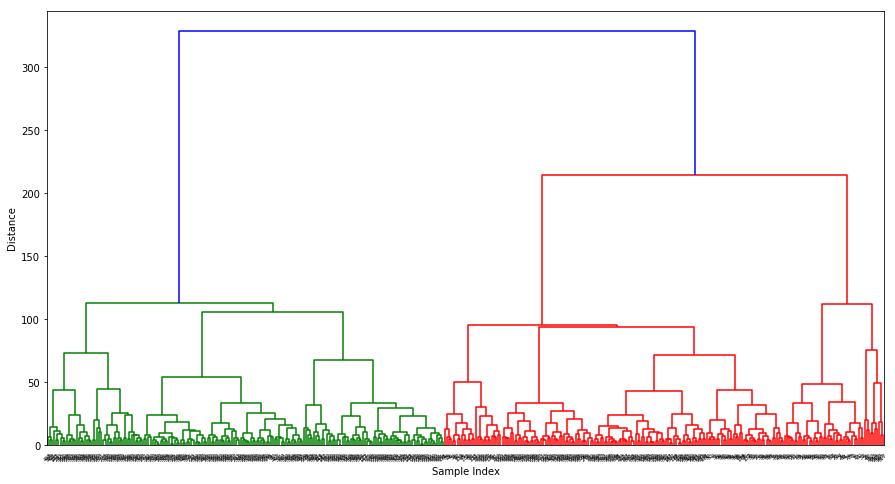

Text(0, 0.5, 'Distance Merged')

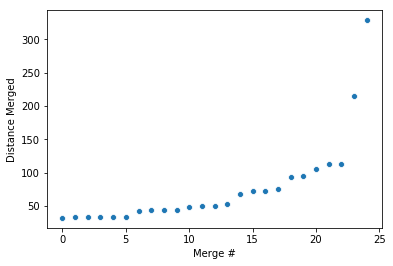

In [39]:
# Agglomerative Clustering

from sklearn.cluster import AgglomerativeClustering
agg_clus = AgglomerativeClustering()
print(agg_clus)

print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
# df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', 'STATE', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)

print(df1.shape)
print('Agglomerative Clustering with features:\n', df1.columns, '\n')
clustering = agg_clus.fit(df1)
print('Clustering Complete')

# Make Dendrogram
print('Making Dendrogram')
Z = linkage(df1, 'ward')
plt.figure(figsize=(15,8))
plt.ylabel('Distance')
plt.xlabel('Sample Index')
dendrogram(Z, leaf_rotation=45.)
plt.show()

# Plot merge distance vs merge#
Z_trunc = Z[-25:,:]
ax=sns.scatterplot(np.arange(len(Z_trunc)), Z_trunc[:,2])
plt.xlabel('Merge #')
plt.ylabel('Distance Merged')

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func='deprecated')
(1492, 46)
(409, 46)
(409, 24)
Agglomerative Clustering with features:
 Index(['AVG_MATH_8_SCORE', 'AVG_READING_4_SCORE', 'AVG_READING_8_SCORE',
       'recent_AVG_MATH_4_SCORE', 'fracn_exp_INSTRUCTION_EXPENDITURE',
       'fracn_exp_SUPPORT_SERVICES_EXPENDITURE', 'fracn_exp_OTHER_EXPENDITURE',
       'fracn_exp_CAPITAL_OUTLAY_EXPENDITURE', 'fracn_rev_FEDERAL_REVENUE',
       'fracn_rev_STATE_REVENUE', 'fracn_rev_LOCAL_REVENUE',
       'fracn_enroll_GRADES_PK_G', 'fracn_enroll_GRADES_KG_G',
       'fracn_enroll_GRADES_4_G', 'fracn_enroll_GRADES_8_G',
       'fracn_enroll_GRADES_12_G', 'fracn_enroll_GRADES_1_8_G',
       'fracn_enroll_GRADES_9_12_G', 'avg_total_revenue',
       'avg_total_expenditure', 'fracn_schoolage', 'rev_per_person',
       'exp_per_rev', 'fracn_GRADES_12div8_G'],
      dtype='object

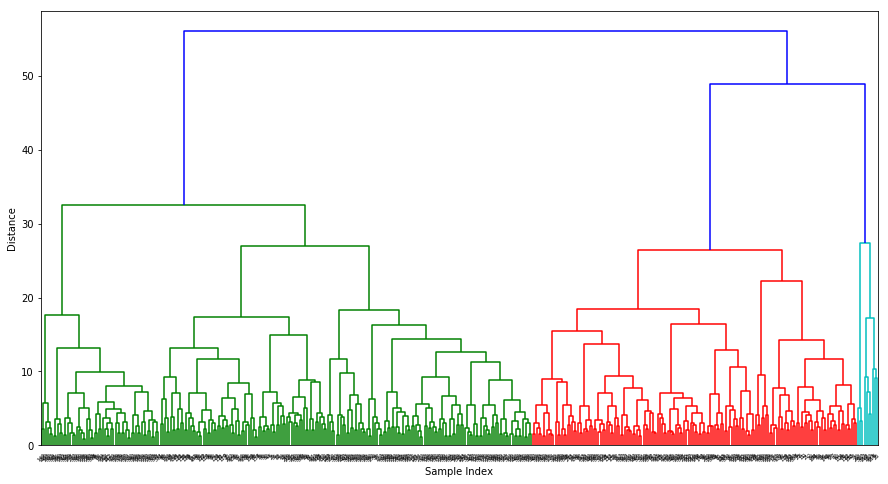

Text(0, 0.5, 'Distance Merged')

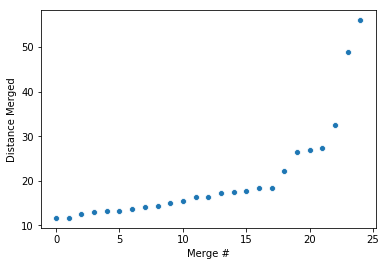

In [40]:
#Scale before clustering

# Agglomerative Clustering
agg_clus = AgglomerativeClustering()
print(agg_clus)

print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
# df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', 'STATE', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)

print(df1.shape)
print('Agglomerative Clustering with features:\n', df1.columns, '\n')

# Scale, then cluster
scaler=StandardScaler()
X_transformed = scaler.fit_transform(df1)
clustering = agg_clus.fit(X_transformed)
print('Clustering Complete')

# Make Dendrogram
print('Making Dendrogram')
Z = linkage(X_transformed, 'ward')
plt.figure(figsize=(15,8))
plt.ylabel('Distance')
plt.xlabel('Sample Index')
dendrogram(Z, leaf_rotation=45.)
plt.show()

# Plot merge distance vs merge#
Z_trunc = Z[-25:,:]
ax=sns.scatterplot(np.arange(len(Z_trunc)), Z_trunc[:,2])
plt.xlabel('Merge #')
plt.ylabel('Distance Merged')

In [41]:
max_d = 6
value_of_interest = 'STATE'

clusters = fcluster(Z, max_d, criterion='maxclust')
clusters
for cluster_iter in (1+np.arange(max_d)): 
    print('Cluster #', cluster_iter, ':')
    print('Values:\n', df.dropna()[clusters==cluster_iter][value_of_interest].unique())
    cur_set = set(df.dropna()[clusters==cluster_iter][value_of_interest])
    other_sets = set(df.dropna()[clusters!=cluster_iter][value_of_interest])
    print('Unique Values:\n', cur_set - other_sets, '\n')


Cluster # 1 :
Values:
 ['CONNECTICUT' 'MASSACHUSETTS' 'NEW_JERSEY' 'VERMONT' 'MAINE' 'MARYLAND'
 'NEW_YORK' 'PENNSYLVANIA' 'NEW_HAMPSHIRE' 'RHODE_ISLAND' 'ILLINOIS']
Unique Values:
 {'NEW_JERSEY'} 

Cluster # 2 :
Values:
 ['COLORADO' 'CONNECTICUT' 'IOWA' 'KENTUCKY' 'MAINE' 'MARYLAND'
 'MASSACHUSETTS' 'VIRGINIA' 'WISCONSIN' 'IDAHO' 'INDIANA' 'MISSOURI'
 'MONTANA' 'NEBRASKA' 'NORTH_DAKOTA' 'OHIO' 'OREGON' 'VERMONT' 'DELAWARE'
 'ILLINOIS' 'KANSAS' 'MICHIGAN' 'NEW_HAMPSHIRE' 'NEW_YORK' 'PENNSYLVANIA'
 'RHODE_ISLAND' 'WASHINGTON' 'NORTH_CAROLINA' 'NEVADA' 'GEORGIA' 'FLORIDA']
Unique Values:
 set() 

Cluster # 3 :
Values:
 ['MINNESOTA' 'WISCONSIN' 'WYOMING' 'KANSAS' 'SOUTH_DAKOTA' 'VIRGINIA'
 'COLORADO' 'IOWA' 'MICHIGAN' 'MISSOURI' 'NEBRASKA' 'OHIO' 'OREGON'
 'ALASKA' 'DELAWARE' 'ILLINOIS' 'INDIANA' 'MONTANA' 'NORTH_DAKOTA'
 'WASHINGTON' 'FLORIDA']
Unique Values:
 {'MINNESOTA', 'WYOMING', 'SOUTH_DAKOTA'} 

Cluster # 4 :
Values:
 ['ALABAMA' 'ARIZONA' 'ARKANSAS' 'CALIFORNIA' 'FLORIDA' 'HAWAII'

In [42]:
# KMeans Clustering

from sklearn.cluster import KMeans
# df.drop(['AVG_MATH_4_SCORE'], axis=1)
print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)

kmeans = KMeans(n_clusters=10)
y_pred = kmeans.fit_predict(df1)

(1492, 46)
(409, 46)


In [43]:
print(df1.columns)

Index(['AVG_MATH_4_SCORE', 'AVG_MATH_8_SCORE', 'AVG_READING_4_SCORE',
       'AVG_READING_8_SCORE', 'recent_AVG_MATH_4_SCORE',
       'fracn_exp_INSTRUCTION_EXPENDITURE',
       'fracn_exp_SUPPORT_SERVICES_EXPENDITURE', 'fracn_exp_OTHER_EXPENDITURE',
       'fracn_exp_CAPITAL_OUTLAY_EXPENDITURE', 'fracn_rev_FEDERAL_REVENUE',
       'fracn_rev_STATE_REVENUE', 'fracn_rev_LOCAL_REVENUE',
       'fracn_enroll_GRADES_PK_G', 'fracn_enroll_GRADES_KG_G',
       'fracn_enroll_GRADES_4_G', 'fracn_enroll_GRADES_8_G',
       'fracn_enroll_GRADES_12_G', 'fracn_enroll_GRADES_1_8_G',
       'fracn_enroll_GRADES_9_12_G', 'avg_total_revenue',
       'avg_total_expenditure', 'fracn_schoolage', 'rev_per_person',
       'exp_per_rev', 'fracn_GRADES_12div8_G', 'STATE_ALABAMA', 'STATE_ALASKA',
       'STATE_ARIZONA', 'STATE_ARKANSAS', 'STATE_CALIFORNIA', 'STATE_COLORADO',
       'STATE_CONNECTICUT', 'STATE_DELAWARE', 'STATE_DISTRICT_OF_COLUMBIA',
       'STATE_FLORIDA', 'STATE_GEORGIA', 'STATE_HAWAII', 'STA

In [44]:
kmeans.cluster_centers_
centers = pd.DataFrame(data=kmeans.cluster_centers_, columns=df1.columns)
centers.sort_values('AVG_MATH_4_SCORE')

,AVG_MATH_4_SCORE,AVG_MATH_8_SCORE,AVG_READING_4_SCORE,AVG_READING_8_SCORE,recent_AVG_MATH_4_SCORE,fracn_exp_INSTRUCTION_EXPENDITURE,fracn_exp_SUPPORT_SERVICES_EXPENDITURE,fracn_exp_OTHER_EXPENDITURE,fracn_exp_CAPITAL_OUTLAY_EXPENDITURE,fracn_rev_FEDERAL_REVENUE,...,STATE_SOUTH_DAKOTA,STATE_TENNESSEE,STATE_TEXAS,STATE_UTAH,STATE_VERMONT,STATE_VIRGINIA,STATE_WASHINGTON,STATE_WEST_VIRGINIA,STATE_WISCONSIN,STATE_WYOMING
5,202.033098,240.746894,189.678570,257.319746,197.813429,0.425815,0.422226,0.036828,0.113981,0.140108,...,-1.734723e-18,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,220.350467,263.876127,208.385555,263.342185,215.331177,0.507984,0.298677,0.059251,0.112338,0.098377,...,0.000000e+00,7.317073e-02,-1.387779e-17,1.387779e-17,1.387779e-17,2.439024e-02,-1.387779e-17,1.387779e-17,1.387779e-17,-1.387779e-17
8,229.537698,273.048560,217.118511,253.883129,223.963031,0.527353,0.293457,0.053641,0.097359,0.095649,...,-6.938894e-18,6.938894e-18,4.166667e-02,6.938894e-18,6.938894e-18,6.938894e-18,-6.938894e-18,8.333333e-02,6.938894e-18,-6.938894e-18
2,233.042497,272.609610,213.033659,266.977501,231.495485,0.502375,0.309031,0.054013,0.105609,0.120839,...,1.561251e-17,6.349206e-02,3.174603e-02,-6.938894e-18,-6.938894e-18,6.938894e-18,-1.734723e-17,9.523810e-02,-6.938894e-18,-1.734723e-17
7,234.177620,280.897626,222.354553,266.073465,227.856525,0.519992,0.284591,0.045768,0.098626,0.072079,...,-5.204170e-18,2.777778e-02,-1.040834e-17,8.333333e-02,2.777778e-02,5.555556e-02,2.777778e-02,1.040834e-17,5.555556e-02,-1.040834e-17
6,239.427655,281.234940,220.531455,253.767753,236.763361,0.517648,0.297294,0.050342,0.095093,0.098196,...,3.469447e-18,2.222222e-02,2.222222e-02,4.444444e-02,1.387779e-17,-1.734723e-17,2.222222e-02,1.387779e-17,2.222222e-02,2.222222e-02
3,239.868521,282.664847,221.436104,265.994103,239.529811,0.541797,0.303712,0.034013,0.073668,0.083263,...,-8.673617e-18,-3.469447e-18,-3.469447e-18,1.040834e-17,6.896552e-02,-3.469447e-18,-1.040834e-17,1.040834e-17,1.040834e-17,6.896552e-02
0,240.820029,283.504575,221.731059,268.661779,239.350027,0.513772,0.296289,0.048546,0.098390,0.104677,...,5.405405e-02,1.387779e-17,6.756757e-02,4.054054e-02,-1.734723e-17,1.351351e-02,2.702703e-02,-1.734723e-17,1.351351e-02,-1.734723e-17
9,244.401644,287.939539,224.841717,261.748906,243.616075,0.514627,0.299945,0.043343,0.094064,0.083955,...,3.076923e-02,6.938894e-18,6.938894e-18,-6.938894e-18,-6.938894e-18,7.692308e-02,4.615385e-02,-6.938894e-18,6.153846e-02,3.076923e-02
4,248.399106,293.170005,229.544598,267.260467,248.304200,0.531910,0.293705,0.038107,0.066280,0.064470,...,-8.673617e-18,0.000000e+00,0.000000e+00,6.938894e-18,1.851852e-01,0.000000e+00,-1.040834e-17,6.938894e-18,6.938894e-18,7.407407e-02


In [45]:
centers['AVG_MATH_4_SCORE']

0    240.820029
1    220.350467
2    233.042497
3    239.868521
4    248.399106
5    202.033098
6    239.427655
7    234.177620
8    229.537698
9    244.401644
Name: AVG_MATH_4_SCORE, dtype: float64

In [46]:
centers.describe()

,AVG_MATH_4_SCORE,AVG_MATH_8_SCORE,AVG_READING_4_SCORE,AVG_READING_8_SCORE,recent_AVG_MATH_4_SCORE,fracn_exp_INSTRUCTION_EXPENDITURE,fracn_exp_SUPPORT_SERVICES_EXPENDITURE,fracn_exp_OTHER_EXPENDITURE,fracn_exp_CAPITAL_OUTLAY_EXPENDITURE,fracn_rev_FEDERAL_REVENUE,...,STATE_SOUTH_DAKOTA,STATE_TENNESSEE,STATE_TEXAS,STATE_UTAH,STATE_VERMONT,STATE_VIRGINIA,STATE_WASHINGTON,STATE_WEST_VIRGINIA,STATE_WISCONSIN,STATE_WYOMING
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01
mean,233.205834,275.969272,216.865578,262.502903,230.402312,0.510327,0.309893,0.046385,0.095541,0.096161,...,8.482328e-03,1.866628e-02,1.632025e-02,1.683183e-02,2.819285e-02,1.703824e-02,1.231809e-02,1.785714e-02,1.528298e-02,1.960310e-02
std,13.534673,14.905100,11.246225,5.620073,15.045234,0.031858,0.039998,0.008295,0.015208,0.022415,...,1.870558e-02,2.821806e-02,2.389705e-02,2.930715e-02,5.951007e-02,2.764470e-02,1.702520e-02,3.775059e-02,2.406969e-02,2.951641e-02
min,202.033098,240.746894,189.678570,253.767753,197.813429,0.425815,0.284591,0.034013,0.066280,0.064470,...,-8.673617e-18,-3.469447e-18,-1.387779e-17,-6.938894e-18,-1.734723e-17,-1.734723e-17,-1.734723e-17,-1.734723e-17,-6.938894e-18,-1.734723e-17
25%,230.413898,272.719347,214.054872,258.427036,224.936405,0.509431,0.294351,0.039416,0.094321,0.083436,...,-6.505213e-18,1.734723e-18,-2.602085e-18,1.734723e-18,-5.204170e-18,0.000000e+00,-1.040834e-17,1.734723e-18,6.938894e-18,-1.301043e-17
50%,236.802638,281.066283,220.983779,264.668144,234.129423,0.516138,0.297986,0.047157,0.097874,0.096922,...,-8.673617e-19,1.040834e-17,3.469447e-18,8.673617e-18,1.040834e-17,6.938894e-18,-3.469447e-18,1.040834e-17,1.214306e-17,-3.469447e-18
75%,240.582152,283.294643,222.198680,266.751492,239.484865,0.525513,0.302770,0.052816,0.103863,0.103102,...,1.257675e-17,2.638889e-02,2.936508e-02,3.040541e-02,2.083333e-02,2.167106e-02,2.582583e-02,1.387779e-17,2.004505e-02,2.863248e-02
max,248.399106,293.170005,229.544598,268.661779,248.304200,0.541797,0.422226,0.059251,0.113981,0.140108,...,5.405405e-02,7.317073e-02,6.756757e-02,8.333333e-02,1.851852e-01,7.692308e-02,4.615385e-02,9.523810e-02,6.153846e-02,7.407407e-02


In [47]:
print(y_pred)

[1 1 1 1 7 7 5 1 1 7 8 1 6 1 8 1 1 1 8 1 7 1 1 1 1 7 5 1 1 8 7 1 1 7 8 7 7
 7 7 8 1 1 8 7 7 1 8 1 1 2 7 7 7 8 1 2 1 1 1 7 0 8 5 8 8 1 7 7 7 6 0 8 1 6
 7 0 2 0 1 7 6 7 1 0 7 1 6 0 7 7 8 7 7 8 7 1 2 7 3 7 7 8 7 6 1 2 2 8 2 0 6
 6 5 6 8 2 0 2 6 0 6 8 8 0 7 9 0 9 1 6 0 6 2 9 3 1 3 0 0 6 2 0 6 2 6 0 2 6
 7 3 9 6 2 6 9 2 3 8 2 2 6 9 6 5 6 2 2 0 6 0 9 9 6 2 9 9 4 0 9 8 0 9 0 2 9
 9 2 3 0 9 0 2 6 9 6 0 0 2 0 0 4 9 0 2 9 9 2 3 2 2 8 9 9 9 1 1 0 2 2 6 0 9
 9 9 0 2 9 9 4 0 9 2 0 0 0 2 9 4 2 3 6 9 0 6 0 9 3 0 9 2 0 6 4 0 9 2 9 3 8
 3 2 6 2 9 9 6 1 0 0 6 0 3 9 9 9 0 2 9 4 4 6 4 2 0 9 0 6 4 4 2 3 0 4 9 0 0
 4 3 6 9 2 0 6 4 9 9 2 0 3 2 3 6 6 2 9 3 3 2 0 6 0 0 3 9 0 9 0 2 9 4 4 0 4
 2 0 0 6 2 4 4 2 3 0 9 9 2 0 4 3 2 0 7 0 0 4 9 9 2 9 4 2 3 6 2 9 3 3 2 6 0
 3 0 3 9 9 0 0 2 9 9 4 2 4 2 0 9 9 2 4 4 2 3 6 9 9 0 3 3 2 0 6 0 0 4 9 0 2
 9 4]


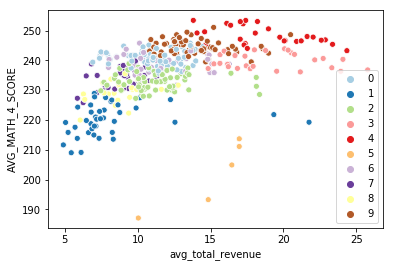

In [48]:
sns.scatterplot('avg_total_revenue', 'AVG_MATH_4_SCORE' , hue=y_pred.astype(np.int), data=df1, \
                legend='full', palette="Paired")

In [49]:
# Affinity Propagation Clustering

from sklearn.cluster import AffinityPropagation
# df.drop(['AVG_MATH_4_SCORE'], axis=1)
print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)

aff_prop = AffinityPropagation()
y_aff_prop = aff_prop.fit_predict(df1)

(1492, 46)
(409, 46)


In [50]:
aff_prop.cluster_centers_
centers = pd.DataFrame(data=aff_prop.cluster_centers_, columns=df1.columns)
centers.sort_values('AVG_MATH_4_SCORE')

,AVG_MATH_4_SCORE,AVG_MATH_8_SCORE,AVG_READING_4_SCORE,AVG_READING_8_SCORE,recent_AVG_MATH_4_SCORE,fracn_exp_INSTRUCTION_EXPENDITURE,fracn_exp_SUPPORT_SERVICES_EXPENDITURE,fracn_exp_OTHER_EXPENDITURE,fracn_exp_CAPITAL_OUTLAY_EXPENDITURE,fracn_rev_FEDERAL_REVENUE,...,STATE_SOUTH_DAKOTA,STATE_TENNESSEE,STATE_TEXAS,STATE_UTAH,STATE_VERMONT,STATE_VIRGINIA,STATE_WASHINGTON,STATE_WEST_VIRGINIA,STATE_WISCONSIN,STATE_WYOMING
1,193.289774,234.428798,190.518073,252.501705,187.134670,0.370584,0.500568,0.026906,0.101943,0.209689,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13,213.698899,248.198742,197.085950,257.960996,211.122299,0.431380,0.383840,0.035689,0.146517,0.117298,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,213.868301,259.844673,207.501170,264.723046,213.844025,0.484304,0.336089,0.046872,0.118121,0.135157,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,220.417006,266.353700,213.858855,253.662756,213.194415,0.489004,0.285977,0.056202,0.144337,0.078157,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0,222.643213,269.754405,218.352728,265.363798,220.762964,0.521663,0.296289,0.050408,0.104462,0.054195,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6,226.247729,266.328359,204.729488,257.714825,217.963756,0.545678,0.298343,0.061231,0.074285,0.134910,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,228.567254,265.259366,205.613937,274.459542,221.808283,0.427945,0.254500,0.030437,0.287118,0.099900,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22,229.868022,269.235646,209.188020,271.222897,227.262261,0.515020,0.320589,0.063106,0.084888,0.222830,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21,230.778869,272.843334,210.410726,264.729845,229.432455,0.506463,0.314254,0.049496,0.098510,0.186623,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,232.463065,280.127947,221.634040,255.021193,224.325125,0.523362,0.254057,0.051659,0.149337,0.068638,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


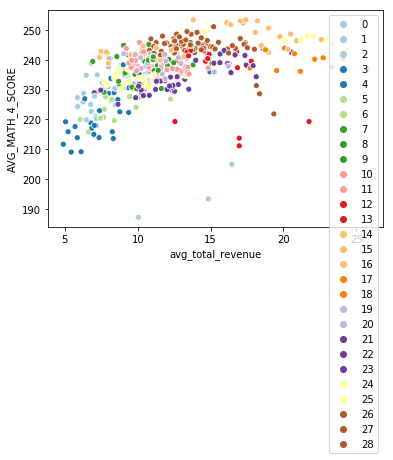

In [51]:
sns.scatterplot('avg_total_revenue', 'AVG_MATH_4_SCORE' , hue=y_aff_prop.astype(np.int), data=df1, \
                legend='full', palette="Paired")

In [52]:
# PCA

from sklearn.decomposition import PCA
pca = PCA()
print(pca)

print(df.shape)
print(df.dropna(axis=0).shape)

df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)
pca.fit(df1)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
(1492, 46)
(409, 46)


PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

Text(0, 0.5, 'Explained Variance')

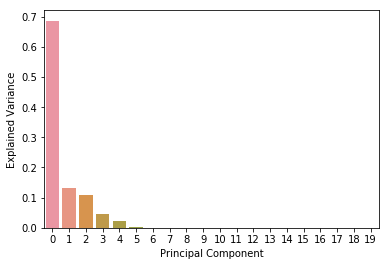

In [53]:
ax = sns.barplot(x=np.arange(20), y=pca.explained_variance_[0:20]/sum(pca.explained_variance_[0:20]))
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')

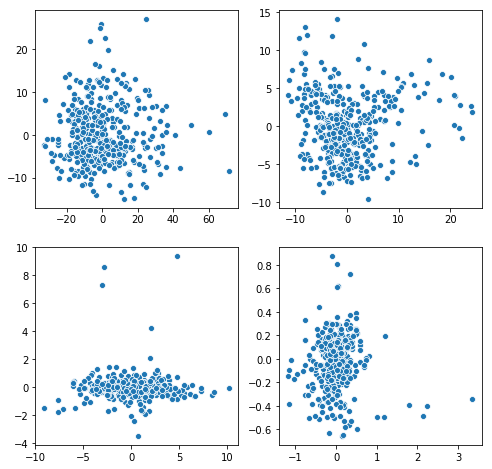

In [54]:
X_pca = pca.fit(df1).transform(df1)
plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
sns.scatterplot(X_pca[:,0], X_pca[:,1])
plt.subplot(2,2,2)
sns.scatterplot(X_pca[:,2], X_pca[:,3])
plt.subplot(2,2,3)
sns.scatterplot(X_pca[:,4], X_pca[:,5])
plt.subplot(2,2,4)
sns.scatterplot(X_pca[:,6], X_pca[:,7])

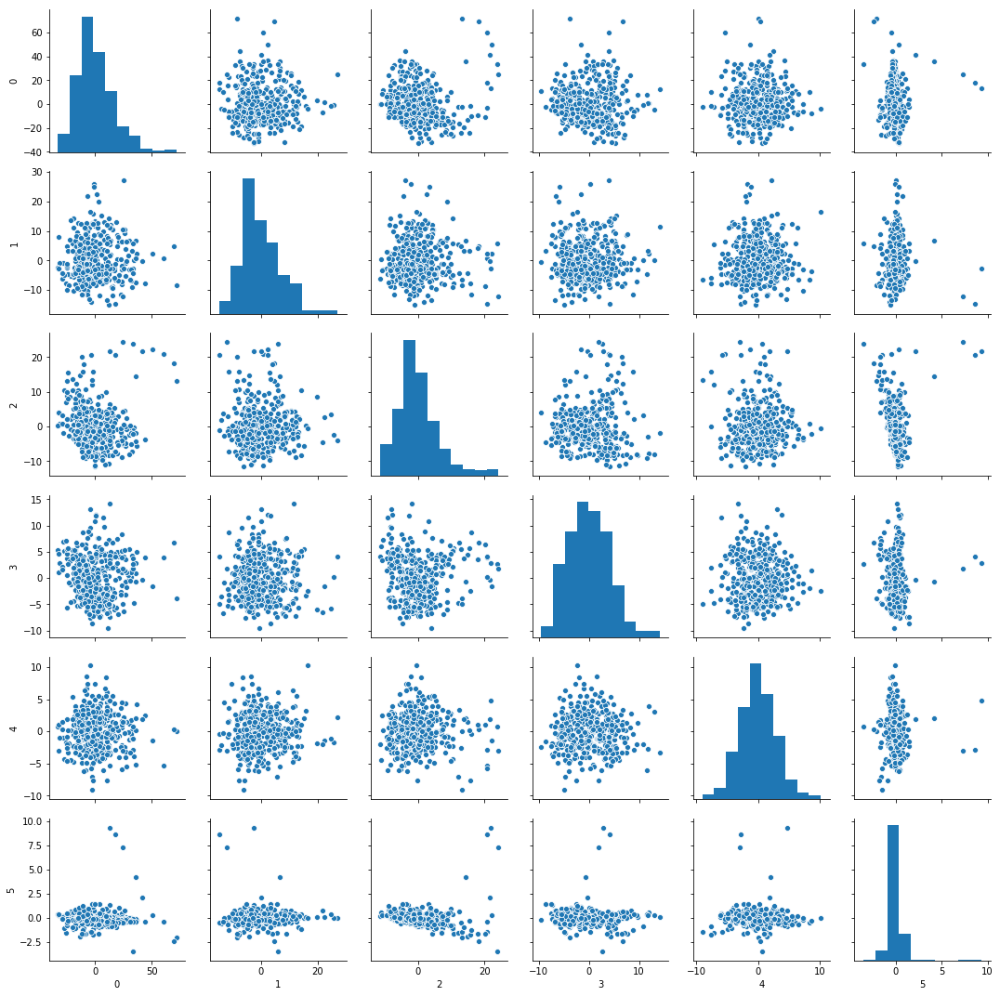

In [55]:
X_pca = pca.fit(df1).transform(df1)
X_pca_df = pd.DataFrame(X_pca[:,:6])
sns.pairplot(X_pca_df)

In [56]:
# Scale then PCA

# PCA
from sklearn.decomposition import PCA
pca = PCA()
print(pca)

print(df.shape)
print(df.dropna(axis=0).shape)

# Prep X
df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY', 'YEAR', 'ENROLL', \
             'TOTAL_REVENUE', 'FEDERAL_REVENUE', 'STATE_REVENUE', 'LOCAL_REVENUE', \
             'TOTAL_EXPENDITURE', 'INSTRUCTION_EXPENDITURE', 'SUPPORT_SERVICES_EXPENDITURE', 'OTHER_EXPENDITURE', \
             'CAPITAL_OUTLAY_EXPENDITURE', \
             'GRADES_PK_G', 'GRADES_KG_G', 'GRADES_4_G', 'GRADES_8_G', 'GRADES_12_G', \
             'GRADES_1_8_G', 'GRADES_9_12_G', 'GRADES_ALL_G']
df1 = df1.drop(drop_cols, axis=1)
df1 = df1.drop('AVG_MATH_4_SCORE', axis=1)

# Scale X
X = df1
scaler=StandardScaler()
X_transformed = scaler.fit_transform(X)

pca.fit(X_transformed)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
(1492, 46)
(409, 46)


/Users/daviderickson/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/daviderickson/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype uint8, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

Text(0, 0.5, 'Explained Variance')

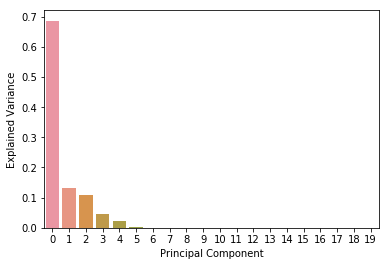

In [57]:
ax = sns.barplot(x=np.arange(20), y=pca.explained_variance_[0:20]/sum(pca.explained_variance_[0:20]))
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')

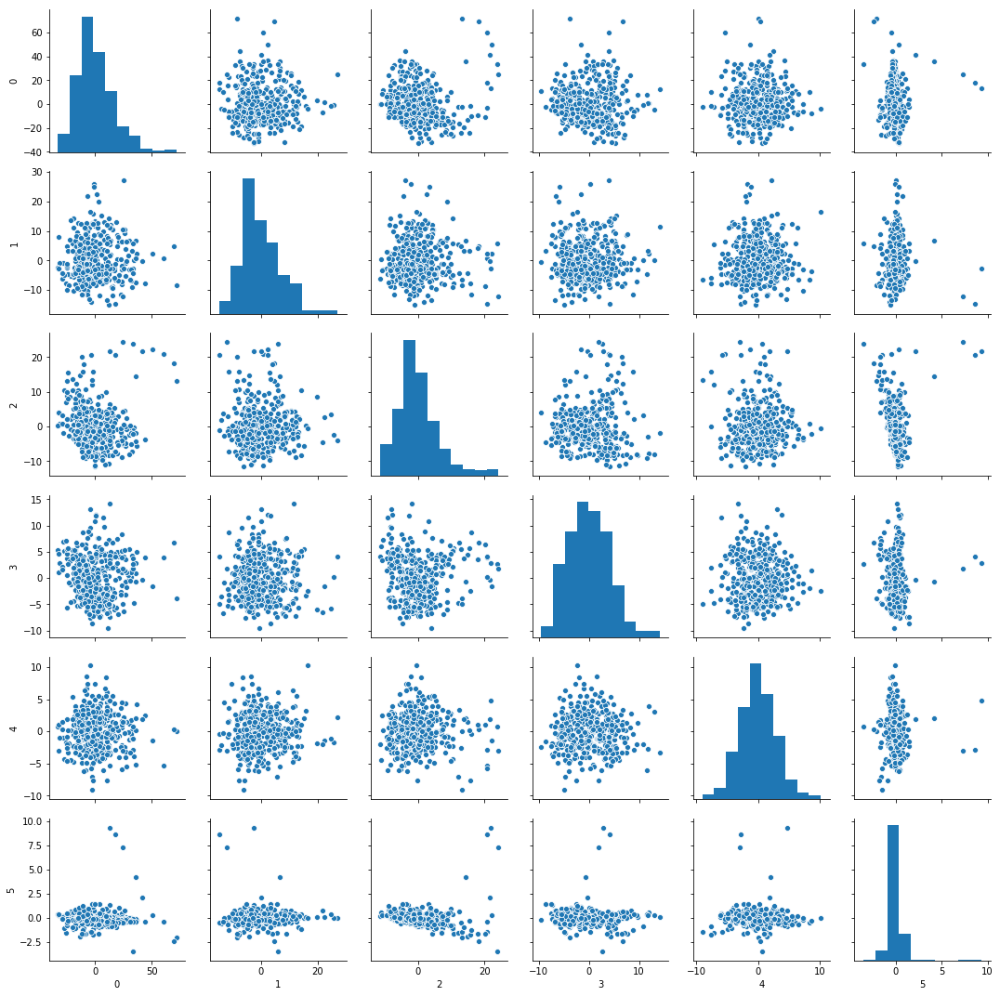

In [58]:
X_pca = pca.fit(df1).transform(df1)
X_pca_df = pd.DataFrame(X_pca[:,:6])
sns.pairplot(X_pca_df)

In [64]:
# Scale then PCA
# Don't drop columns unnecesarily

# PCA
from sklearn.decomposition import PCA
pca = PCA()
print(pca)

print(df.shape)
print(df.dropna(axis=0).shape)

# Prep X
df1 = df.dropna(axis=0)
df1 = pd.get_dummies(df1, columns=['STATE'])
drop_cols = ['PRIMARY_KEY']
df1 = df1.drop(drop_cols, axis=1)

# Scale X
X = df1
scaler=StandardScaler()
X_transformed = scaler.fit_transform(X)

pca.fit(X_transformed)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
(1492, 46)
(409, 46)


/Users/daviderickson/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/daviderickson/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

Text(0, 0.5, 'Explained Variance')

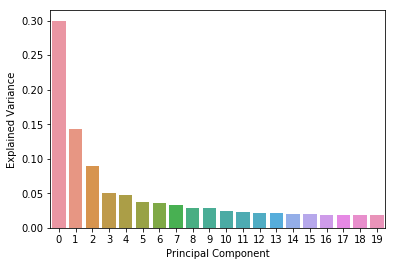

In [65]:
ax = sns.barplot(x=np.arange(20), y=pca.explained_variance_[0:20]/sum(pca.explained_variance_[0:20]))
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')

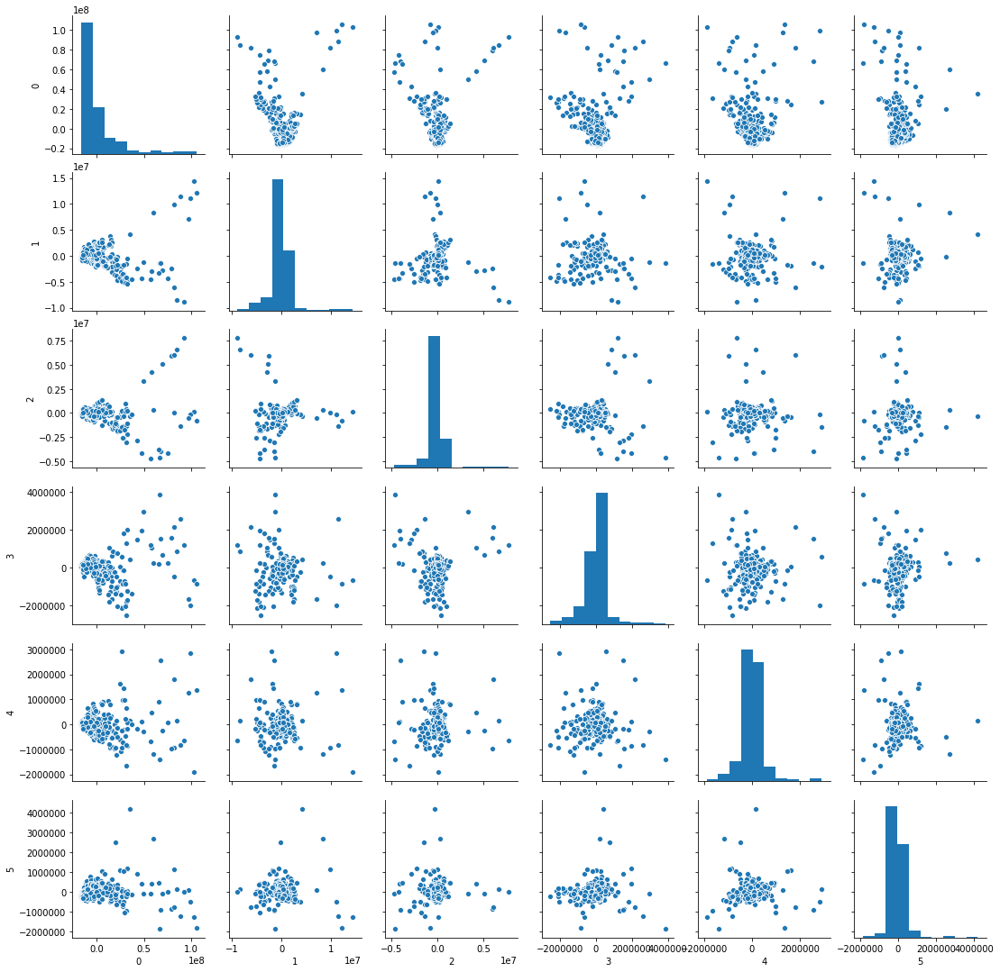

In [67]:
X_pca = pca.fit(df1).transform(df1)
X_pca_df = pd.DataFrame(X_pca[:,:6])
sns.pairplot(X_pca_df)

In [62]:
kill script

SyntaxError: invalid syntax (<ipython-input-62-d2c2696ae6e6>, line 1)

In [ ]:
g = sns.FacetGrid(df, row="STATE") 
g.map(plt.scatter, 'YEAR', 'AVG_MATH_4_SCORE')

In [ ]:
sns.lmplot(x="YEAR", y="AVG_MATH_4_SCORE", hue="STATE", data=df.dropna(), legend_out=True);

In [ ]:
plt.hist('avg_total_expenditure', bins=50, log=True, data=df);

In [ ]:
#For some reason VIRGINIA has 3 entries for 2008 and 2 of them have increicbly high avg_instruction_expenditure
df[df['avg_total_expenditure'] > 100]

In [ ]:
df['AVG_MATH_4_SCORE'].dropna().hist(density=True, cumulative=True)
plt.show()
df['AVG_MATH_4_SCORE'].dropna().hist()

In [ ]:
sns.jointplot("YEAR", "AVG_MATH_4_SCORE", data=df, kind="reg")
sns.jointplot("YEAR", "AVG_READING_4_SCORE", data=df, kind="reg")

In [ ]:
sns.jointplot("avg_total_revenue", "AVG_READING_4_SCORE", data=df, kind="reg")

In [ ]:
sns.jointplot("avg_total_expenditure", "AVG_MATH_4_SCORE", data=df, kind="reg")

In [ ]:
sns.jointplot("AVG_READING_4_SCORE", "AVG_MATH_4_SCORE", data=df, kind="reg")

In [ ]:
sns.jointplot("AVG_MATH_8_SCORE", "AVG_MATH_4_SCORE", data=df, kind="reg")

In [ ]:
df1=df.drop(['PRIMARY_KEY','AVG_MATH_8_SCORE','AVG_READING_4_SCORE','AVG_READING_8_SCORE','ENROLL'],axis=1)
df1 = df1.dropna()
print(df1.columns)
df1 = pd.get_dummies(df1, columns=['STATE'])

y=df1.loc[:,'AVG_MATH_4_SCORE'].values
X=df1.drop(['AVG_MATH_4_SCORE'],axis=1).loc[:,:].values
X_cols=df1.drop(['AVG_MATH_4_SCORE'],axis=1).columns

ts_cv = TimeSeriesSplit(n_splits=5)
print(ts_cv)
for train_index, test_index in ts_cv.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

"""
PredefinedSplit won't work because it folds in future data

test_fold = df1.loc[:,'YEAR'].values
ps = PredefinedSplit(test_fold)
print(ps.get_n_splits())
for train_index, test_index in ps.split():
    print("Train:", train_index, "Test:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]    
"""

In [ ]:
n_splits=20
ts_cv = TimeSeriesSplit(n_splits=n_splits)
rf_model = RandomForestRegressor(n_estimators=100, n_jobs=-1)

index=0
train_score = np.zeros(n_splits)
test_score = np.zeros(n_splits)

for train_index, test_index in ts_cv.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]   
    
    rf_model.fit(X_train, y_train) 
    Y_rf=rf_model.predict(X_test)
    train_score[index]=rf_model.score(X_train,y_train) #Train score
    test_score[index]=rf_model.score(X_test,y_test) #Test score
    index+=1
index_list=np.arange(index)

In [ ]:
print(index)
print(index_list)
print(train_score)
print(test_score)

In [ ]:
plt.plot(index_list,train_score,'o', label="Train")
plt.plot(index_list,test_score,'o', label="Test")
plt.xlabel("Split")
plt.ylabel("R^2 Score")
plt.legend(loc="best")

In [ ]:
model=RandomForestRegressor()

num_splits=30
ts_cv=TimeSeriesSplit(n_splits=num_splits) #.split(X)

"""
param_search = [
  {'n_estimators': [1, 10, 20, 100]}
]
gsrch_rf_model=GridSearchCV(estimator=model, param_grid=param_search, cv=ts_cv, n_jobs=-1)
gsrch_rf_model.fit(X,y)
"""

#train_sizes, train_scores, test_scores = \
#    learning_curve(estimator=model, X=X, y=y, train_sizes=np.linspace(0.1,1.0,num=10), cv=ts_cv, n_jobs=-1)

param_range=[4,5,6,7,8,9,10,20,30,40,50,60]
train_scores_vc, test_scores_vc = \
    validation_curve(estimator=model, X=X, y=y, param_name="n_estimators", param_range=param_range, cv=ts_cv, n_jobs=-1)

In [ ]:
train_scores_mean = np.mean(train_scores_vc, axis=1)
train_scores_std = np.std(train_scores_vc, axis=1)
test_scores_mean = np.mean(test_scores_vc, axis=1)
test_scores_std = np.std(test_scores_vc, axis=1)

plt.figure()
plt.plot(param_range,train_scores_mean,'o',label="Train")
plt.plot(param_range,test_scores_mean,'o',label="Test")
plt.xlabel("n_estimators")
plt.ylabel("Score")
plt.title("Validation Curves")
plt.legend(loc="best")

In [ ]:
model=RandomForestRegressor(n_estimators=20)

num_splits=30
ts_cv=TimeSeriesSplit(n_splits=num_splits) #.split(X)

train_sizes, train_scores, test_scores = \
    learning_curve(estimator=model, X=X, y=y, train_sizes=np.linspace(0.1,1.0,num=30), cv=ts_cv, n_jobs=-1)

In [ ]:
plt.figure()
plt.plot(train_sizes, -train_scores.mean(1), 'o-', color="g",
         label="Train")
plt.plot(train_sizes, -test_scores.mean(1), 'o-', color="r",
         label="Test")
plt.xlabel("Train Size")
plt.ylabel("Score")
plt.title("Learning Curves")
plt.legend(loc="best")

In [ ]:
rf_model = RandomForestRegressor(n_estimators=100)
rf_model.fit(X, y)  

In [ ]:
Y_rf=rf_model.predict(X)
plt.plot(Y_rf, y, 'ro')
plt.show()

In [ ]:
rf_model.score(X,y)

In [ ]:
feature_importances_rf = pd.DataFrame(rf_model.feature_importances_, index = df1.drop(['AVG_MATH_4_SCORE'],axis=1).columns, columns=['importance']).sort_values('importance',ascending=False)
feature_importances_rf.head(10)

In [ ]:
sns.jointplot(x='YEAR', y='AVG_MATH_4_SCORE', data=df, kind='reg')
sns.jointplot(x='fracn_enroll_GRADES_12_G', y='AVG_MATH_4_SCORE', data=df, kind='reg')
sns.jointplot(x='fracn_rev_FEDERAL_REVENUE', y='AVG_MATH_4_SCORE', data=df, kind='reg')

In [ ]:
from sklearn import svm
svm_model = svm.SVR(gamma='scale')
svm_model.fit(X, y)  

In [ ]:
Y_svm=svm_model.predict(X)
plt.plot(Y_svm, y, 'ro')
plt.show()

# Lasso

In [ ]:
model=linear_model.Lasso(normalize=True)
param_search = [
  {'alpha': [0.00001,0.0001,0.001,0.01,0.1,1]}
 ]

num_splits=30
ts_cv=TimeSeriesSplit(n_splits=num_splits) #.split(X)

#gsrch_rf_model=GridSearchCV(estimator=model, param_grid=param_search, cv=ts_cv, n_jobs=-1)
#gsrch_rf_model.fit(X,y)

#train_sizes, train_scores, test_scores = \
#    learning_curve(estimator=model, X=X, y=y, train_sizes=np.linspace(0.1,1.0,num=10), cv=ts_cv, n_jobs=-1)

param_range=[0.00001,0.0001,0.001,0.005,0.01,0.02,0.05,0.1,0.2,0.3,0.5,1]
train_scores_vc, test_scores_vc = \
    validation_curve(estimator=model, X=X, y=y, param_name="alpha", param_range=param_range, cv=ts_cv, n_jobs=-1)

train_scores_mean = np.mean(train_scores_vc, axis=1)
train_scores_std = np.std(train_scores_vc, axis=1)
test_scores_mean = np.mean(test_scores_vc, axis=1)
test_scores_std = np.std(test_scores_vc, axis=1)

plt.figure()
plt.semilogx(param_range,train_scores_mean,'o',label="Train")
plt.semilogx(param_range,test_scores_mean,'o',label="Test")
plt.semilogx(param_range,test_scores_mean,label="Test_curve")
plt.xlabel("alpha")
plt.ylabel("Score")
plt.title("Validation Curves")
plt.legend(loc="best")

In [ ]:
model=linear_model.Lasso(alpha=0.01, normalize=True)
#lasso_model.fit(X, y)  
#Y_lasso=lasso_model.predict(X)

num_splits=5
ts_cv=TimeSeriesSplit(n_splits=num_splits) #.split(X)

train_sizes, train_scores, test_scores = \
    learning_curve(estimator=model, X=X, y=y, train_sizes=np.linspace(0.1,1.0,num=30), cv=ts_cv, n_jobs=-1)

print(train_sizes.shape,train_scores.shape, test_scores.shape)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure()
plt.plot(train_sizes,train_scores_mean,'o',label="Train")
plt.plot(train_sizes,test_scores_mean,'o',label="Test")
plt.xlabel("Train Sizes")
plt.ylabel("Score")
plt.title("Learning Curves")
plt.legend(loc="best")

In [ ]:
"""Plot test data fit"""

In [ ]:

lasso_model=linear_model.Lasso(alpha=0.01, normalize=True)
lasso_model.fit(X, y)  
Y_lasso=lasso_model.predict(X)
plt.plot(Y_lasso, y, 'ro')

# Generated linear fit
slope, intercept, r_value, p_value, std_err = stats.linregress(Y_lasso,y)
line = slope*Y_lasso+intercept

plt.plot(Y_lasso,y,'o',Y_lasso,line,Y_lasso,Y_lasso)
plt.legend(("y","fit_lasso","y=x"),loc='best')
plt.xlabel("Y_lasso")
plt.ylabel("y")

In [ ]:
lasso_coef_ = lasso_model.coef_
print(X_cols.shape)
#print(X_cols)
print(lasso_coef_.shape)
print(np.round(lasso_coef_))
#print(lasso_coef_)
X_cols[np.abs(lasso_coef_)>10]

sorted(zip(lasso_coef_.round(), X_cols))

In [ ]:
scaler=StandardScaler()
X_transformed = scaler.fit_transform(X)

model=linear_model.Lasso(alpha=0.01, normalize=True)
lasso_model.fit(X_transformed, y)  
Y_lasso=lasso_model.predict(X_transformed)

lasso_coef_ = lasso_model.coef_
print(X_cols.shape)
#print(X_cols)
print(lasso_coef_.shape)
print(np.round(lasso_coef_))
#print(lasso_coef_)
X_cols[np.abs(lasso_coef_)>10]

sorted(zip(lasso_coef_, X_cols))

In [ ]:
"""fracn_GRADES_12div8_G
is not chosen by Lasso. RandomForest says it's #2 tho. Why?
Plot.
"""
plt.figure(figsize=[7,7])
x1=df1.loc[:,'fracn_GRADES_12div8_G'].values
plt.plot(x1,y,'o')
plt.plot(x1,Y_lasso, alpha=0.7)
plt.legend(("y","fit_lasso"),loc=(0.7,0.2))
plt.xlabel("fracn_GRADES_12div8_G")
plt.ylabel("y")

In [ ]:
plt.figure(figsize=[20,10])

plt.subplot(2, 2, 1)
x1=df1.loc[:,'fracn_enroll_GRADES_12_G'].values
print(y.shape,np.shape(lasso_coef_*X),x1.shape)
plt.plot(x1,y,'o',x1,Y_lasso, alpha=0.7)
plt.legend(("y","fit_lasso"),loc=(0.7,0.2))
plt.xlabel("fracn_enroll_GRADES_12_G")
plt.ylabel("y")

plt.subplot(2, 2, 2)
x1=df1.loc[:,'fracn_enroll_GRADES_9_12_G'].values
print(y.shape,np.shape(lasso_coef_*X),x1.shape)
plt.plot(x1,y,'o',x1,Y_lasso, alpha=0.7)
plt.legend(("y","fit_lasso"),loc=(0.7,0.2))
plt.xlabel("fracn_enroll_GRADES_9_12_G")
plt.ylabel("y")

plt.subplot(2, 2, 3)
x1=df1.loc[:,'YEAR'].values
print(y.shape,np.shape(lasso_coef_*X),x1.shape)
plt.plot(x1,y,'o',x1,Y_lasso, alpha=0.7)
plt.legend(("y","fit_lasso"),loc=(0.7,0.2))
plt.xlabel("YEAR")
plt.ylabel("y")

plt.subplot(2, 2, 4)
x1=df1.loc[:,'STATE_DISTRICT_OF_COLUMBIA'].values
print(y.shape,np.shape(lasso_coef_*X),x1.shape)
plt.plot(x1,y,'o',x1,Y_lasso, alpha=0.7)
plt.legend(("y","fit_lasso"),loc=(0.7,0.2))
plt.xlabel("STATE_DISTRICT_OF_COLUMBIA")
plt.ylabel("y")

In [ ]:
plt.figure(figsize=[15,10])

plt.subplot(2, 2, 1)
plt.plot(Y_lasso,y,'o',Y_lasso,line,Y_lasso,Y_lasso)
plt.legend(("y","fit_lasso","y=x"),loc='best')
plt.xlabel("Y_lasso")
plt.ylabel("y")

In [ ]:
# Generated linear fit
slope, intercept, r_value, p_value, std_err = stats.linregress(Y_lasso,y)
line = slope*Y_lasso+intercept

#need to make analysis_df that has y,Y_lasso

#Plot
#grid=sns.JointGrid(x=Y_lasso,y=y)
#g=grid.plot_joint(sns.scatterplot) #, hue='smoker'
#sns.scatterplot(Y_lasso,line, ax=g.ax_marg_x, legend=False)
#sns.lmplot(Y_lasso,Y_lasso,ax=g.ax_marg_x,legend=False)

#plt.subplot(1,2,1)
ax1 = sns.jointplot(x=Y_lasso,y=y,kind="kde")
#plt.subplot(1,2,2)
ax2 = sns.jointplot(x=Y_lasso,y=y,kind="resid")

In [ ]:
"""The largest coefficients are"""
X_cols[np.abs(lasso_coef_)>0.5]
""". Plot them with fits."""

plt.plot(Y_svm, y, 'ro')("YEAR", "AVG_MATH_4_SCORE", data=df, kind="reg")
sns.jointplot("YEAR", "AVG_MATH_4_SCORE", data=df, kind="reg")


In [ ]:
"""
Can I predict test scores for a year?

Handle time better. Time_series_split

Time trends: 
-Scores
-Populations
-Revenues
-Expenditures

Delta from previous time point as feature?

Features:
-Elite? financials, location, 
-Good school? school history, tax rev, district
-Trends in time? Deltas in time. more money, more students, higher scores, ...


"""